### Rice Classification Analysis

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.offline as pyo
import plotly.express as px

import seaborn as sns
import missingno as msno

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.figure_factory as ff

from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV

from sklearn import metrics
from sklearn.metrics import roc_curve,auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

from mlxtend.plotting import plot_confusion_matrix

%matplotlib inline
pyo.init_notebook_mode()

## 1. Performing simple operations on dataframe 

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/riceClassification.csv')
df

,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,1,4537,92.229317,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,4,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,5,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1
...,...,...,...,...,...,...,...,...,...,...,...,...
18180,18181,5853,148.624571,51.029281,0.939210,6008,86.326537,0.498594,332.960,0.663444,2.912535,0
18181,18182,7585,169.593996,58.141659,0.939398,7806,98.272692,0.647461,385.506,0.641362,2.916910,0
18182,18183,6365,154.777085,52.908085,0.939760,6531,90.023162,0.561287,342.253,0.682832,2.925396,0
18183,18184,5960,151.397924,51.474600,0.940427,6189,87.112041,0.492399,343.371,0.635227,2.941216,0


In [ ]:
df.columns

Index(['id', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity',
       'ConvexArea', 'EquivDiameter', 'Extent', 'Perimeter', 'Roundness',
       'AspectRation', 'Class'],
      dtype='object')

In [ ]:
print('Total number of rows are:', df.shape[0])
print('Total number of columns are:', df.shape[1])

Total number of rows are: 18185
Total number of columns are: 12


In [ ]:
df.describe()

,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
count,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000
mean,9093.000000,7036.492989,151.680754,59.807851,0.915406,7225.817872,94.132952,0.616653,351.606949,0.707998,2.599081,0.549079
std,5249.701658,1467.197150,12.376402,10.061653,0.030575,1502.006571,9.906250,0.104389,29.500620,0.067310,0.434836,0.497599
min,1.000000,2522.000000,74.133114,34.409894,0.676647,2579.000000,56.666658,0.383239,197.015000,0.174590,1.358128,0.000000
25%,4547.000000,5962.000000,145.675910,51.393151,0.891617,6125.000000,87.126656,0.538530,333.990000,0.650962,2.208527,0.000000
50%,9093.000000,6660.000000,153.883750,55.724288,0.923259,6843.000000,92.085696,0.601194,353.088000,0.701941,2.602966,1.000000
75%,13639.000000,8423.000000,160.056214,70.156593,0.941372,8645.000000,103.559146,0.695664,373.003000,0.769280,2.964101,1.000000
max,18185.000000,10210.000000,183.211434,82.550762,0.966774,11008.000000,114.016559,0.886573,508.511000,0.904748,3.911845,1.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18185 entries, 0 to 18184
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               18185 non-null  int64  
 1   Area             18185 non-null  int64  
 2   MajorAxisLength  18185 non-null  float64
 3   MinorAxisLength  18185 non-null  float64
 4   Eccentricity     18185 non-null  float64
 5   ConvexArea       18185 non-null  int64  
 6   EquivDiameter    18185 non-null  float64
 7   Extent           18185 non-null  float64
 8   Perimeter        18185 non-null  float64
 9   Roundness        18185 non-null  float64
 10  AspectRation     18185 non-null  float64
 11  Class            18185 non-null  int64  
dtypes: float64(8), int64(4)
memory usage: 1.7 MB


> It is clear from the above output that there are no categorical columns present in the dataset.

In [ ]:
df.isna().sum(axis=0)

id                 0
Area               0
MajorAxisLength    0
MinorAxisLength    0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Perimeter          0
Roundness          0
AspectRation       0
Class              0
dtype: int64

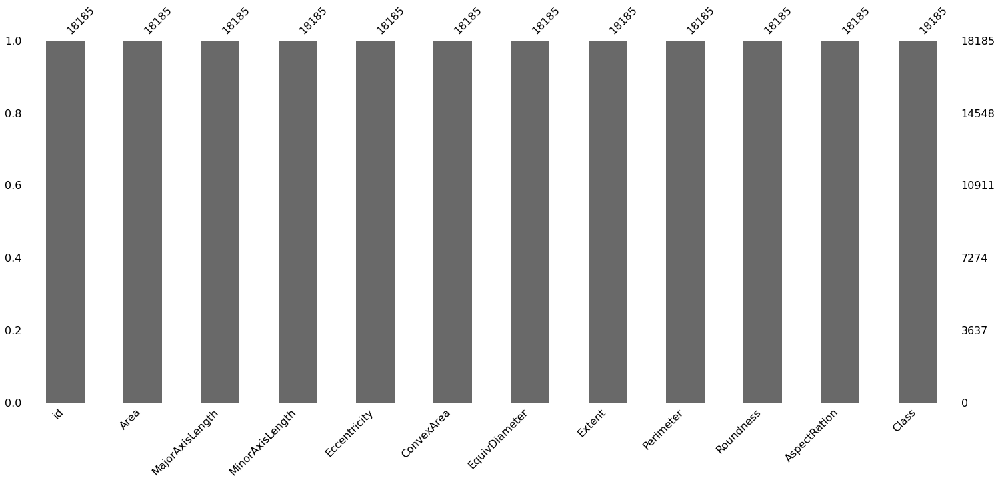

In [ ]:
msno.bar(df)

> There are no missing numbers or empty values in any feature present in the dataset.

## 2. Checking whether dataset is balanced or not 

In [ ]:
print('There are total',df['Class'].nunique(),'unique values in the outcome column')
print('Unique values in outcome column are',df['Class'].unique())

There are total 2 unique values in the outcome column
Unique values in outcome column are [1 0]


In [ ]:
print('Total number of 0(False count) are',(df['Class']==0).sum())
print('Total number of 1(True count) are',(df['Class']==1).sum())

Total number of 0(False count) are 8200
Total number of 1(True count) are 9985


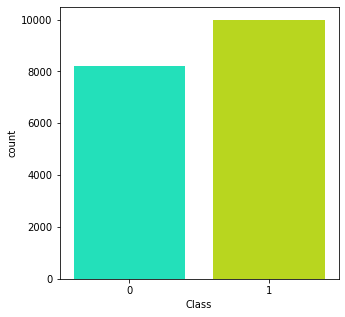

In [ ]:
plt.figure(figsize=(5,5))
colors = ['#04FFCD','#CCF500']
sns.countplot(x='Class',data=df,palette=colors)
plt.show()

> From the above output figure it is clear that the output classes are pretty well balanced and there is no need of sampling.

## 3. Building correlation matrix

> Feature selection process is the vital part in the whole life cycle.

> It is clear from the dataframe that there is no need of Id column and hence our first step would be to remove that unnecessary column from the dataframe. 

In [ ]:
df.drop(columns=['id'],inplace=True)
df

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,4537,92.229317,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1
...,...,...,...,...,...,...,...,...,...,...,...
18180,5853,148.624571,51.029281,0.939210,6008,86.326537,0.498594,332.960,0.663444,2.912535,0
18181,7585,169.593996,58.141659,0.939398,7806,98.272692,0.647461,385.506,0.641362,2.916910,0
18182,6365,154.777085,52.908085,0.939760,6531,90.023162,0.561287,342.253,0.682832,2.925396,0
18183,5960,151.397924,51.474600,0.940427,6189,87.112041,0.492399,343.371,0.635227,2.941216,0


In [ ]:
df.corr()

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
Area,1.000000,0.599939,0.930215,-0.550073,0.999362,0.998158,0.230541,0.881540,0.620490,-0.623979,-0.816589
MajorAxisLength,0.599939,1.000000,0.273211,0.295717,0.602061,0.618002,-0.073549,0.870178,-0.202566,0.240471,-0.147741
MinorAxisLength,0.930215,0.273211,1.000000,-0.808640,0.928992,0.923790,0.308541,0.674249,0.834398,-0.860516,-0.917766
Eccentricity,-0.550073,0.295717,-0.808640,1.000000,-0.547896,-0.534688,-0.329954,-0.165915,-0.903657,0.950301,0.788636
ConvexArea,0.999362,0.602061,0.928992,-0.547896,1.000000,0.997403,0.227359,0.886987,0.610236,-0.621472,-0.814214
EquivDiameter,0.998158,0.618002,0.923790,-0.534688,0.997403,1.000000,0.225944,0.891567,0.607432,-0.609957,-0.809361
Extent,0.230541,-0.073549,0.308541,-0.329954,0.227359,0.225944,1.000000,0.073227,0.366793,-0.350875,-0.303440
Perimeter,0.881540,0.870178,0.674249,-0.165915,0.886987,0.891567,0.073227,1.000000,0.186063,-0.227256,-0.533274
Roundness,0.620490,-0.202566,0.834398,-0.903657,0.610236,0.607432,0.366793,0.186063,1.000000,-0.947875,-0.831759
AspectRation,-0.623979,0.240471,-0.860516,0.950301,-0.621472,-0.609957,-0.350875,-0.227256,-0.947875,1.000000,0.832563


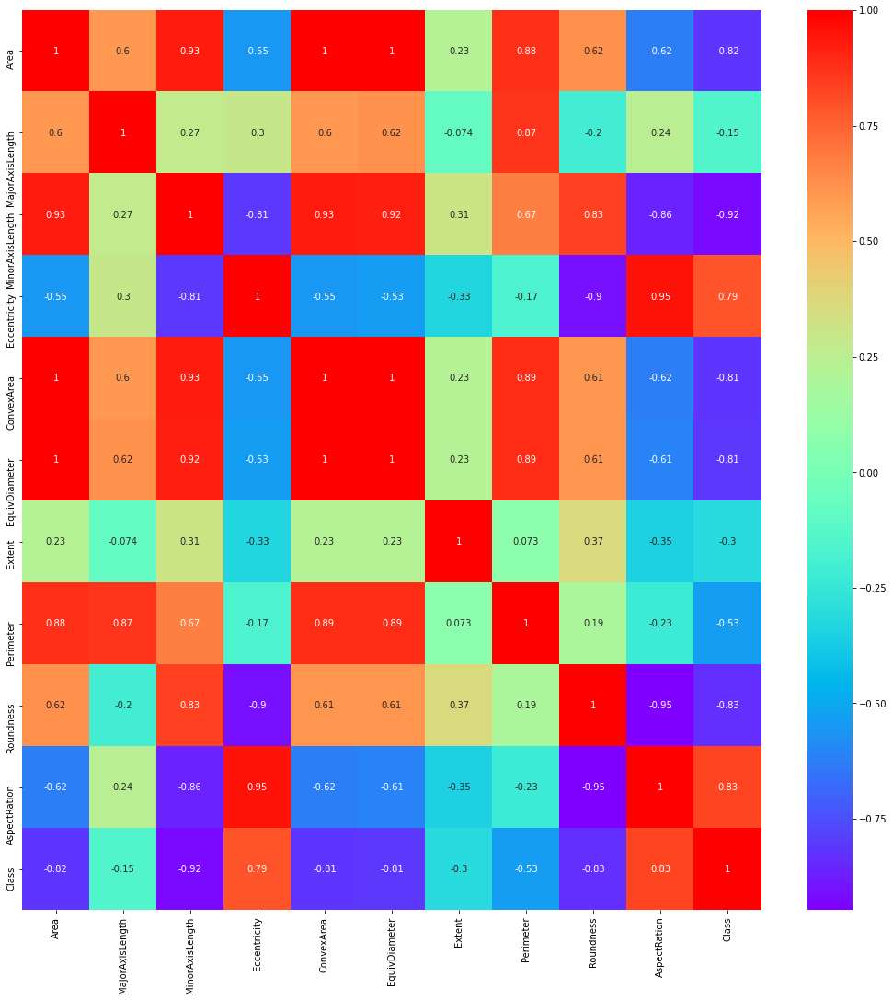

In [ ]:
correlation_mat = df.corr()
corr_features = correlation_mat.index
plt.figure(figsize=(18,18))
g = sns.heatmap(df[corr_features].corr(),annot=True,cmap='rainbow')
plt.show()

## 4. Cleaning the data (Removing the outliers)

### Outliers

> An observation which differs from an overall pattern on a sample dataset is called an **outlier**.

> The outliers may suggest experimental errors, variability in a measurement, or an anomaly. The age of a person may wrongly be recorded as 200 rather than 20 Years. Such an outlier should definitely be discarded from the dataset.

> However, not all outliers are bad. Some outliers signify that data is significantly different from others. For example, it may indicate an anomaly like bank fraud or a rare disease.

### Significance of Outliers

> Outliers badly affect mean and standard deviation of the dataset. These may statistically give erroneous results.

> Most machine learning algorithms do not work well in the presence of outlier. So it is desirable to detect and remove outliers.

> Outliers are highly useful in anomaly detection like fraud detection where the fraud transactions are very different from normal transactions.

### Approach of Inter Quartile Range to detect outliers

>  Inter Quartile Range approach to finding the outliers is the most commonly used and most trusted approach used in the research field.

* Below is the box plot which helps to explain IQR Method easily.

   ![](https://miro.medium.com/max/1246/1*0MvBAT8zFSOt6sfEojbI-A.png)

> A box plot tells us, more or less, about the distribution of the data. It gives a sense of how much the data is actually spread about, what’s its range, and about its skewness.

> As you might have noticed in the figure, that a box plot enables us to draw inference from it for an ordered data, i.e., it tells us about the various metrics of a data arranged in ascending order.

> In the above figure, **minimum** is the minimum value in the dataset and **maximum** is the maximum value in the dataset. So the difference between the two tells us about the range of dataset.   

> The median is the median (or centre point), also called second quartile, of the data (resulting from the fact that the data is ordered).

> Q1 is the first quartile of the data, i.e., to say 25% of the data lies between minimum and Q1.

> Q3 is the third quartile of the data, i.e., to say 75% of the data lies between minimum and Q3.

> The difference between Q3 and Q1 is called the **Inter-Quartile Range** or **IQR**.

In [ ]:
df

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,4537,92.229317,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1
...,...,...,...,...,...,...,...,...,...,...,...
18180,5853,148.624571,51.029281,0.939210,6008,86.326537,0.498594,332.960,0.663444,2.912535,0
18181,7585,169.593996,58.141659,0.939398,7806,98.272692,0.647461,385.506,0.641362,2.916910,0
18182,6365,154.777085,52.908085,0.939760,6531,90.023162,0.561287,342.253,0.682832,2.925396,0
18183,5960,151.397924,51.474600,0.940427,6189,87.112041,0.492399,343.371,0.635227,2.941216,0


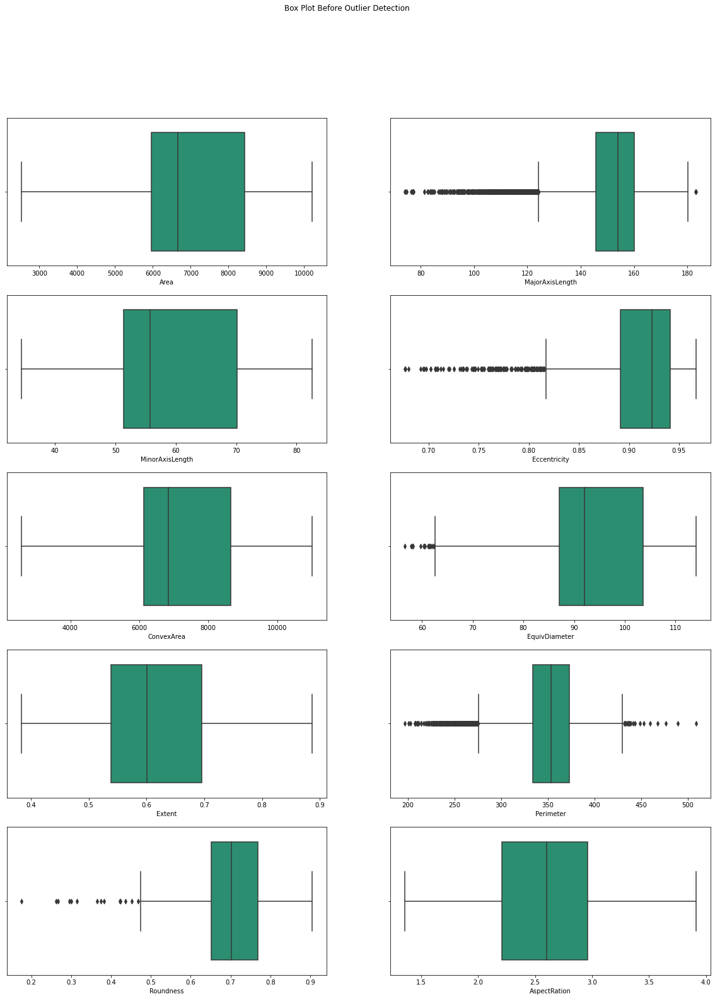

In [ ]:
fig, axes = plt.subplots(5,2, figsize=(20,25))
fig.suptitle('Box Plot Before Outlier Detection')
k = 0
for i in range(0,5):
    for j in range(0,2):
        sns.boxplot(ax=axes[i,j], data=df, x=df.columns[k], palette='Dark2')
        k=k+1

In [ ]:
# Calculating the IQR
def iqr_calculation(main_df,col):
    Q1 = np.percentile(col,25,interpolation = 'midpoint')
    Q3 = np.percentile(col,75,interpolation = 'midpoint')
    IQR = Q3 - Q1
    upper = np.where(col>=(Q3+1.5*IQR))
    lower = np.where(col<=(Q1-1.5*IQR))
    return upper,lower
    
# Remove the outliers
def remove_outliers(main_df,upper,lower):
    main_df.drop(upper[0], inplace = True)
    main_df.drop(lower[0], inplace = True)
    print("New Shape: ", main_df.shape)
    return main_df

# Resetting the dataframe index
def reset_dataframe(main_df):
    main_df.reset_index(inplace=True)
    main_df.drop(columns=['index'],inplace=True)
    return main_df

In [ ]:
main_df = df

for i in range(0,len(main_df.columns)-1):
    print('For ',df.columns[i])
    upper, lower = iqr_calculation(main_df,df[df.columns[i]])
    main_df = remove_outliers(main_df,upper,lower)
    final_df = reset_dataframe(main_df)

For  Area
New Shape:  (18185, 11)
For  MajorAxisLength
New Shape:  (17647, 11)
For  MinorAxisLength
New Shape:  (17647, 11)
For  Eccentricity
New Shape:  (17631, 11)
For  ConvexArea
New Shape:  (17631, 11)
For  EquivDiameter
New Shape:  (17631, 11)
For  Extent
New Shape:  (17631, 11)
For  Perimeter
New Shape:  (17602, 11)
For  Roundness
New Shape:  (17597, 11)
For  AspectRation
New Shape:  (17597, 11)


In [ ]:
final_df

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,6374,129.576759,63.762307,0.870549,6476,90.086785,0.662234,314.656,0.809003,2.032184,1
1,6946,136.303603,65.738475,0.876009,7115,94.042128,0.594437,338.782,0.760508,2.073422,1
2,5786,125.555431,59.626250,0.880040,5945,85.831020,0.623491,307.304,0.769931,2.105707,1
3,5896,127.013995,59.843292,0.882050,6092,86.643063,0.610352,309.264,0.774655,2.122443,1
4,6082,129.098407,60.416315,0.883736,6204,87.999107,0.661375,308.106,0.805111,2.136814,1
...,...,...,...,...,...,...,...,...,...,...,...
17592,5853,148.624571,51.029281,0.939210,6008,86.326537,0.498594,332.960,0.663444,2.912535,0
17593,7585,169.593996,58.141659,0.939398,7806,98.272692,0.647461,385.506,0.641362,2.916910,0
17594,6365,154.777085,52.908085,0.939760,6531,90.023162,0.561287,342.253,0.682832,2.925396,0
17595,5960,151.397924,51.474600,0.940427,6189,87.112041,0.492399,343.371,0.635227,2.941216,0


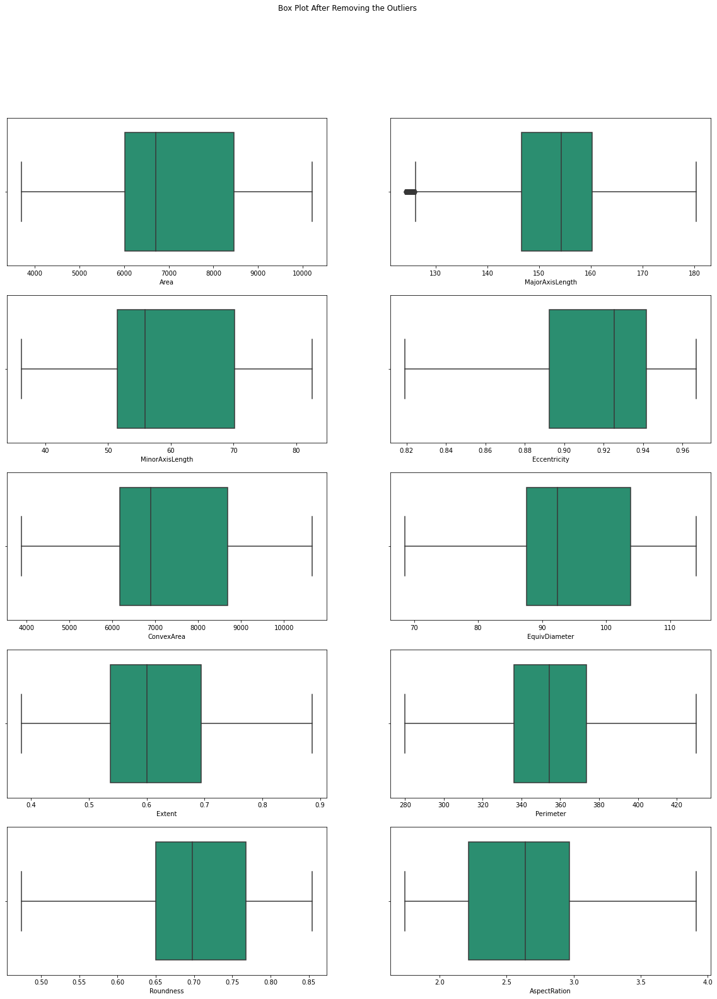

In [ ]:
fig, axes = plt.subplots(5,2, figsize=(20,25))
fig.suptitle('Box Plot After Removing the Outliers')
k = 0
for i in range(0,5):
    for j in range(0,2):
        col_name = final_df.columns[k]
        sns.boxplot(ax=axes[i,j], data=final_df,x=col_name,palette='Dark2')
        k=k+1

## 5. Simple Data Visualization 

In [ ]:
lst = [i for i in final_df.columns]
fig = make_subplots(rows=5, cols=2,subplot_titles=(lst))

k=0
for i in range(1,6):
    for j in range(1,3):
        col_name = final_df.columns[k]
        fig.append_trace(go.Histogram(x=final_df[final_df.columns[k]],name=final_df.columns[k]), row=i, col=j)
        fig.update_layout(
                            template='plotly_dark',
                            height=1500, 
                            width=1200,
                            title_text="Histogram of all the input features",
                            font_family="Times New Roman"
                        )
        k=k+1

fig.show()

## 6. Applying Standardization and Splitting the training data 

In [ ]:
y = final_df['Class']
X = final_df.drop(columns=['Class'])

> Now, we will standardize the whole data.Data standardization is the process of rescaling the attributes so that they have mean as 0 and variance as 1.

> The ultimate goal to perform standardization is to bring down all the features to a common scale without distorting the differences in the range of the values.

> In sklearn.preprocessing.StandardScaler(), centering and scaling happens independently on each feature.

> The formula which performs standardization is  (x−mean)/(sd) 

> fit_transform() is used on the training data so that we can scale the training data and also learn the scaling parameters of that data.

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X_scaled,y,test_size=0.3,random_state=42)

## 7. Logistic Regression Algorithm

The accuracy is99.14772727272727%
[[2376   33]
 [  12 2859]]
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2409
           1       0.99      1.00      0.99      2871

    accuracy                           0.99      5280
   macro avg       0.99      0.99      0.99      5280
weighted avg       0.99      0.99      0.99      5280



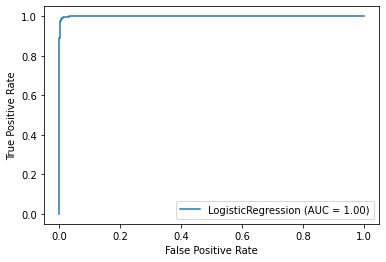

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
 
lr_model = LogisticRegression(solver="liblinear",random_state=0)
lr_model.fit(X_train,y_train)
 
Y_pred = lr_model.predict(X_test)
print("The accuracy is"+str(metrics.accuracy_score(y_test,Y_pred)*100)+"%")
print(confusion_matrix(y_test, Y_pred))
#target_names = ['class 0', 'class 1']
print(classification_report(y_test, Y_pred))
fpr, tpr, thresholds = metrics.roc_curve(y_test, Y_pred,pos_label=1)
metrics.plot_roc_curve(lr_model, X_test, y_test)
plt.show()

In [ ]:
print("Total 0's in training data:",(y_train == 0).sum())
print("Total 1's in training data:",(y_train == 1).sum())
print("Total 0's in testing data:",(y_test == 0).sum())
print("Total 1's in testing data:",(y_test == 1).sum())

Total 0's in training data: 5646
Total 1's in training data: 6671
Total 0's in testing data: 2409
Total 1's in testing data: 2871


### **Logistic Regression Feature Importance**

> We can fit a Logistic Regression model on the given dataset and retrieve the coeff_ property that contains the coefficients found for each input variable.

> These coefficients can provide the basis for a crude feature importance score. This assumes that the input variables have the same scale or have been scaled prior to fitting a model.

> Results may vary given the stochastic nature of the algorithm or evaluation procedure, or differences in numerical precision.

> We know that it is a classification problem with classes 0 and 1. Notice that the coefficients are both positive and negative. The positive scores indicate a feature that predicts class 1, whereas the negative scores indicate a feature that predicts class 0.

> No clear pattern of important and unimportant features can be identified from these results.

In [ ]:
importance = lr_model.coef_[0]

for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))

fig = px.bar(x=[x for x in range(len(importance))], y=importance)
fig.update_layout(template='plotly_dark',
                  height=700, 
                  width=1000,
                  title_text="Feature score using Logistic Regression",
                  xaxis_title="Total number of features",
                  yaxis_title="Importance of each feature",
                  font=dict(
                            family="Times New Roman, monospace",
                            size=14,
                            color="White"
                           )
                 )
fig.show()

Feature: 0, Score: -1.58986
Feature: 1, Score: 1.34640
Feature: 2, Score: -0.72318
Feature: 3, Score: 0.30021
Feature: 4, Score: -2.29733
Feature: 5, Score: -1.66395
Feature: 6, Score: 0.02023
Feature: 7, Score: -0.01974
Feature: 8, Score: -2.80963
Feature: 9, Score: 0.67782


### **Hyperparameter Tuning**

> Logistic regression does not really have any critical hyperparameters to tune. But sometimmes we can see useful differences in performance or convergence with different **solvers**.

> Regularization(penalty) can also be useful sometimes.

> The C parameter which is there helps to control the penalty strength, which can also be effective.

> In the below code snippet, I have used the GridSearchCV in order to tune the hyperparameters.

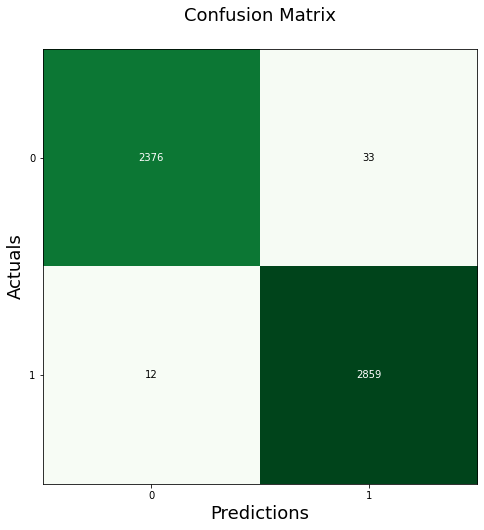

In [ ]:
conf_matrix = confusion_matrix(y_true=y_test, y_pred=Y_pred)
fig, ax = plot_confusion_matrix(conf_mat=conf_matrix, figsize=(8,8), cmap=plt.cm.Greens)
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

## 8. Naive Bayes Classifier



The accuracy is98.90151515151516%
[[2357   52]
 [   6 2865]]
              precision    recall  f1-score   support

     class 0       1.00      0.98      0.99      2409
     class 1       0.98      1.00      0.99      2871

    accuracy                           0.99      5280
   macro avg       0.99      0.99      0.99      5280
weighted avg       0.99      0.99      0.99      5280



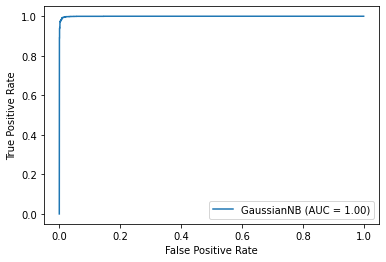

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import MultinomialNB

classifer = GaussianNB()
model = classifer.fit(X_train, y_train)
Y_pred = model.predict(X_test)
print("The accuracy is"+str(metrics.accuracy_score(y_test,Y_pred)*100)+"%")
print(confusion_matrix(y_test, Y_pred))
target_names = ['class 0', 'class 1']
print(classification_report(y_test, Y_pred,target_names=target_names))
fpr, tpr, thresholds = metrics.roc_curve(y_test, Y_pred,pos_label=1)
metrics.plot_roc_curve(model, X_test, y_test)
plt.show()

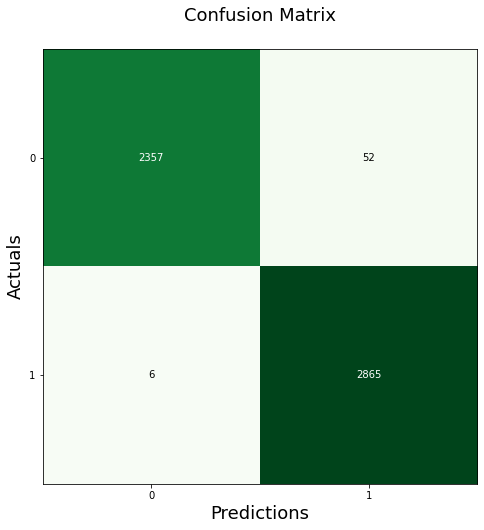

In [ ]:
conf_matrix = confusion_matrix(y_true=y_test, y_pred=Y_pred)
fig, ax = plot_confusion_matrix(conf_mat=conf_matrix, figsize=(8,8), cmap=plt.cm.Greens)
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

The accuracy is98.4659090909091%
[[2337   72]
 [   9 2862]]
              precision    recall  f1-score   support

     class 0       1.00      0.97      0.98      2409
     class 1       0.98      1.00      0.99      2871

    accuracy                           0.98      5280
   macro avg       0.99      0.98      0.98      5280
weighted avg       0.98      0.98      0.98      5280



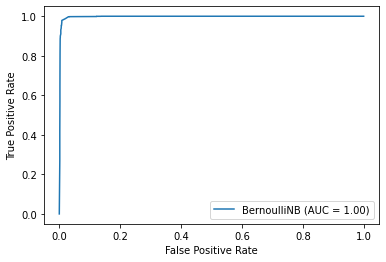

In [ ]:
classifer = BernoulliNB()
model = classifer.fit(X_train, y_train)
Y_pred = model.predict(X_test)
print("The accuracy is"+str(metrics.accuracy_score(y_test,Y_pred)*100)+"%")
print(confusion_matrix(y_test, Y_pred))
target_names = ['class 0', 'class 1']
print(classification_report(y_test, Y_pred,target_names=target_names))
fpr, tpr, thresholds = metrics.roc_curve(y_test, Y_pred,pos_label=1)
metrics.plot_roc_curve(model, X_test, y_test)
plt.show()

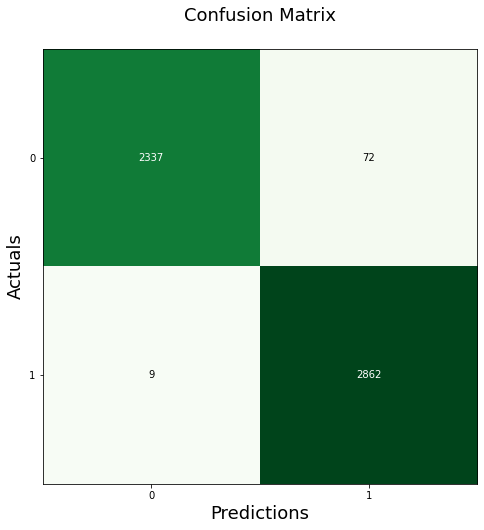

In [ ]:
conf_matrix = confusion_matrix(y_true=y_test, y_pred=Y_pred)
fig, ax = plot_confusion_matrix(conf_mat=conf_matrix, figsize=(8,8), cmap=plt.cm.Greens)
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

## 9. KNN



The accuracy is98.86363636363636%
[[2371   38]
 [  22 2849]]
              precision    recall  f1-score   support

     class 0       0.99      0.98      0.99      2409
     class 1       0.99      0.99      0.99      2871

    accuracy                           0.99      5280
   macro avg       0.99      0.99      0.99      5280
weighted avg       0.99      0.99      0.99      5280



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:808: UndefinedMetricWarning:

No positive samples in y_true, true positive value should be meaningless



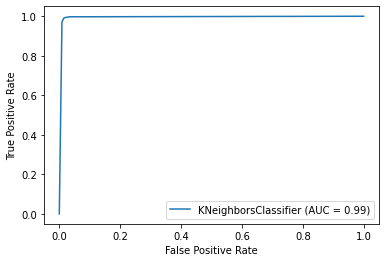

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=3, n_jobs=-1,metric="euclidean").fit(X_train,y_train);
Y_pred = knn.predict(X_test)
print("The accuracy is"+str(metrics.accuracy_score(y_test,Y_pred)*100)+"%")
print(confusion_matrix(y_test, Y_pred))
target_names = ['class 0', 'class 1']
print(classification_report(y_test, Y_pred,target_names=target_names))
fpr, tpr, thresholds = metrics.roc_curve(y_test, Y_pred,pos_label=2)
metrics.plot_roc_curve(knn, X_test, y_test)
plt.show()

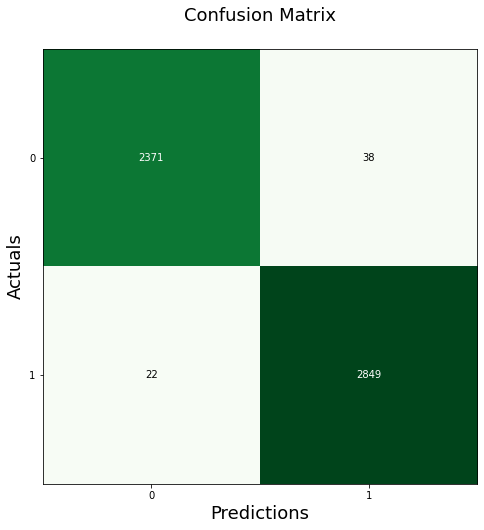

In [ ]:
conf_matrix = confusion_matrix(y_true=y_test, y_pred=Y_pred)
fig, ax = plot_confusion_matrix(conf_mat=conf_matrix, figsize=(8,8), cmap=plt.cm.Greens)
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

In [ ]:
from sklearn.utils import shuffle
x,y = shuffle( X_scaled[:5000], y[:5000]) 


AttributeError: ignored

# LOOCV

In [ ]:
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import LeaveOneOut

predicted = cross_val_predict(classifer,x,y, cv=LeaveOneOut()) 
metrics.accuracy_score(y, predicted)

0.9936

## 10. Conclusion 

In [ ]:
models = pd.DataFrame({
    'Model' : [ 'Logistic Regression', 'Decision Tree Classifier', 'Random Forest Classifier'],
    'Score' : [ lr_score, dtc_score, rfc_score]
})
models.sort_values(by = 'Score', ascending = False)

In [ ]:
px.bar(data_frame = models, x = 'Score', y = 'Model', color = 'Score', template = 'plotly_dark', 
       title = 'Comparison of Classification Algorithms')